In [2]:
#%matplotlib widget

from Xana import Xana
import numpy as np
import os

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

import seaborn as sns

import pathlib
from pathlib import Path

from scipy.integrate import trapz, simps

In [3]:
import importlib
import analysis_helper as ah

importlib.reload(ah)

<module 'analysis_helper' from '/asap3/petra3/gpfs/p10/2024/data/11018867/processed/mora/analysis_helper.py'>

<span style="font-weight:bold; color:red">Input proposal path</span>

In [4]:
proposal_path = Path("/asap3/petra3/gpfs/p10/2024/data/11018867")

print(proposal_path)

/asap3/petra3/gpfs/p10/2024/data/11018867


<span style="font-weight:bold; color:red">Input mask and setup files</span>

In [5]:
# Eiger4M
mask_e4m   = proposal_path / "processed" / "_masks" / "mask_usaxs_e4m_pyfai2.npy"
setup_e4m  = proposal_path / "processed" / "_setups" / "usaxs_e4m_12q.pkl"

# Eiger500k
mask_e500  = proposal_path / "processed" / "_masks" / "mask_usaxs_e500_pyfai.npy"
setup_e500 = proposal_path / "processed" / "_setups" / "usaxs_e500_12q.pkl"

In [6]:
masks = dict()
masks['e4m']   = mask_e4m
masks['e500']  = mask_e500

setups = dict()
setups['e4m']   = setup_e4m
setups['e500']  = setup_e500

detector_folder = {'eiger500k': 'e500', 'eiger4m': 'e4m'}

---

### Check available samples in RAW folder 

In [7]:
samples = ah.get_raw_samples(proposal_path)
samples

{0: 'Aerogel_01',
 1: 'Background_01',
 2: 'Background_02',
 3: 'GWS',
 4: 'LaB6_01',
 5: 'Logbook',
 6: 'SPOCK',
 7: 'align_01',
 8: 'align_02',
 9: 'align_03',
 10: 'align_04',
 11: 'align_05',
 12: 'align_06',
 13: 'align_07',
 14: 'e4m_dummy2',
 15: 'e4m_dummy3',
 16: 'e4m_dummy4',
 17: 'e4m_restart',
 18: 'e4m_restart2',
 19: 'e4m_restart3',
 20: 'm0001_20mgml_BLG_pH2_RT',
 21: 'm0002_20mgml_BLG_pH2_90C_for_1h',
 22: 'm0003_20mgml_BLG_pH2_RT',
 23: 'm0004_20mgml_BLG_pH2_90C_for_5h',
 24: 'm0005_sample1_HEWL_20mgml_pure_24C',
 25: 'm0006_sample2_HEWL_20mgml_heated_at65C',
 26: 'm0007_sample2_HEWL_20mgml_heated_at65C_Au',
 27: 'm0008_sample3_HEWL_20mgml_heated_at65C_Au',
 28: 'm0009_sample3_HEWL_20mgml_heated_at65C_Au',
 29: 'm0010_sample3_HEWL_20mgml_heated_at65C_Au',
 30: 'm0011_sample3_HEWL_20mgml_heated_at65C_Au',
 31: 'm0012_buffer_100mMNaCl_10mMHCl',
 32: 'm0013_starch_100mgml_110C',
 33: 'm0014_BSA_YCl3_dense_10C',
 34: 'm0015_BSA_YCl3_dense_5C',
 35: 'm0016_BSA_YCl3_dense_15

### Check available scans for the specified sample

In [14]:
sampleId = 45

scans = ah.get_sample_scans(proposal_path,samples[sampleId])

Sample name    : m0026_Lara_water
scans available: [1, 2, 3]


### Check available detectors for scans for the specified sample

In [8]:
detectors = ah.get_scan_detectors(proposal_path, samples[sampleId], scans)

Detectors available for m0026_Lara_water:
Scan 1    : ['e4m']
Scan 2    : ['e4m']
Scan 3    : ['e4m']


---

## Calculate SAXS / XPCS (will be saved to database)

<span style="font-weight:bold; color:red">Input data to analyse: sampleId (int), scans_to_analyse (list), detector (str), analysis_type (list)</span>

In [ ]:
sampleId = 45

scans_to_analyse = scans        # or input manually below
scans_to_analyse = [3]
# scans_to_analyse = [17, 18]



# detector = 'eiger500k'
detector = 'eiger4m'

analysis_type = ['saxs'] 

NameError: name 'scans' is not defined

<span style="font-weight:bold; color:blue">In some cases (for unknown reason) the code below fails to process the sequencies of scans, returning an error from one of the workers. In this case you need to restart the kernel and process the scans one by one, putting a single values into the variable "scans_to_analyse"</span>

In [14]:
sample = samples[sampleId]
sample_path = proposal_path / "processed" / "_results" / f"{sample}"
sample_path.mkdir(parents=True, exist_ok=True)


d = Xana(fmtstr='p10_eiger_h5',       
         sample = sample,  
         detector = detector,
         maskfile  = masks[detector_folder[detector]], 
         setupfile = setups[detector_folder[detector]])


db_file_path = sample_path / "analysis_database.pkl"
d.mksavdir(sample_path)
!chmod a+w {db_file_path}

for run_series in scans_to_analyse:
    
    print(f"Processing series no. {run_series}:")
    print("-------------------------------------")
    
    
    d.connect(proposal_path / "raw" / f"{sample}_{run_series:05d}/{detector_folder[detector]}")
    database_id = d.meta[d.meta['series']==run_series].index.values
    
    if 'xpcs' in analysis_type:
        d.analyze(database_id, 'xpcs', verbose=True, nprocs=4, nread_procs=1, norm='symmetric', saxs='compute', first=10, #last=5000,
                  twotime_par=list(np.arange(len(d.setup.qroi))), use_multitau=False)
    
    database_id = d.meta[d.meta['series']==run_series].index.values
    
    if 'saxs' in analysis_type:
        d.analyze(database_id, 'saxs', verbose=True, first=10)
    
    
    print(f"... calculation for scan {run_series} successfully complete")
    print()
    
!chmod a+w {db_file_path}

Loaded setupfile:
	/asap3/petra3/gpfs/p10/2024/data/11018867/processed/_setups/usaxs_e4m_12q.pkl.
Changing savdir to:
	/asap3/petra3/gpfs/p10/2024/data/11018867/processed/_results/m0026_Lara_water/
Try loading database:
	/asap3/petra3/gpfs/p10/2024/data/11018867/processed/_results/m0026_Lara_water/analysis_database.pkl
Successfully loaded database
Processing series no. 3:
-------------------------------------


#### Starting saxs Analysis ####
Series: 0 in folder /asap3/petra3/gpfs/p10/2024/data/11018867/raw/m0026_Lara_water_00003/e4m

Using 1 processes to read data.

Results saved to:
	/asap3/petra3/gpfs/p10/2024/data/11018867/processed/_results/m0026_Lara_water/s0003_0006.pkl

Results saved to:
	/asap3/petra3/gpfs/p10/2024/data/11018867/processed/_results/m0026_Lara_water/analysis_database.pkl
... calculation for scan 3 successfully complete



### Just to check available content after the calculation

In [15]:
d.db

,use,sample,analysis,mod,savname,savfile,setupfile,comment,series,subset,t_delay,t_exposure,t_readout,nframes,first,last,master,datdir
0,True,m0026_Lara_water,xpcs,2024-05-16 16:31:27.489324,s0001_0000.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,1.0,0.0,0.10001,0.10,0.00001,990.0,10.0,999.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
1,True,m0026_Lara_water,saxs,2024-05-16 16:31:53.809247,s0001_0001.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,1.0,0.0,0.10001,0.10,0.00001,990.0,10.0,999.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
2,True,m0026_Lara_water,xpcs,2024-05-16 16:32:38.697748,s0002_0002.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,2.0,0.0,0.10001,0.10,0.00001,990.0,10.0,999.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
3,True,m0026_Lara_water,saxs,2024-05-16 16:33:16.251767,s0002_0003.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,2.0,0.0,0.10001,0.10,0.00001,990.0,10.0,999.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
4,True,m0026_Lara_water,xpcs,2024-05-16 16:33:28.964644,s0003_0004.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,3.0,0.0,0.05001,0.05,0.00001,190.0,10.0,199.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
5,True,m0026_Lara_water,xpcs,2024-05-16 16:37:57.943142,s0003_0005.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,3.0,0.0,0.05001,0.05,0.00001,190.0,10.0,199.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
6,True,m0026_Lara_water,saxs,2024-05-16 16:42:19.747075,s0003_0006.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,3.0,0.0,0.05001,0.05,0.00001,190.0,10.0,199.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...


## Plotting XPCS

<span style="font-weight:bold; color:blue">Warning: check that the corresponding database was created in the "Calculate SAXS / XPCS" section !!! </span>

<span style="font-weight:bold; color:red">Input data to analyse: sampleId (int)</span>

In [10]:
sampleId = 3

print(f"Analysing TTCF for {samples[sampleId]}")

Analysing TTCF for m0018_starch_100mgml_110C_abs9


In [11]:
d = Xana()

sample = samples[sampleId]
sample_path = proposal_path / "processed" / "_results" / f"{sample}"

d.load_db(sample_path / "analysis_database.pkl")

Try loading database:
	/asap3/petra3/gpfs/p10/2024/data/11018867/processed/_results/m0018_starch_100mgml_110C_abs9/analysis_database.pkl
Successfully loaded database


In [12]:
# just to check whether everything is ok with the database
d.db

,use,sample,analysis,mod,savname,savfile,setupfile,comment,series,subset,t_delay,t_exposure,t_readout,nframes,first,last,master,datdir
0,True,m0018_starch_100mgml_110C_abs9,xpcs,2024-03-17 16:03:04.529806,s0002_0000.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,2.0,0.0,0.053,0.05,0.00001,1490.0,10.0,1499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
1,True,m0018_starch_100mgml_110C_abs9,xpcs,2024-03-17 16:03:21.362386,s0001_0001.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,1.0,0.0,0.103,0.10,0.00001,90.0,10.0,99.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
2,True,m0018_starch_100mgml_110C_abs9,xpcs,2024-03-17 16:04:23.151657,s0002_0002.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,2.0,NaN,0.053,0.05,0.00001,1490.0,10.0,1499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
3,True,m0018_starch_100mgml_110C_abs9,xpcs,2024-03-17 16:52:09.379369,s0001_0003.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,1.0,0.0,0.103,0.10,0.00001,90.0,10.0,99.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
4,True,m0018_starch_100mgml_110C_abs9,xpcs,2024-03-17 16:55:51.705756,s0003_0004.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,3.0,0.0,0.053,0.05,0.00001,1490.0,10.0,1499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
5,True,m0018_starch_100mgml_110C_abs9,xpcs,2024-03-17 16:57:55.489671,s0004_0005.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,4.0,0.0,0.053,0.05,0.00001,1490.0,10.0,1499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
6,True,m0018_starch_100mgml_110C_abs9,xpcs,2024-03-17 17:24:28.081720,s0005_0006.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,5.0,0.0,0.103,0.10,0.00001,2490.0,10.0,2499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
7,True,m0018_starch_100mgml_110C_abs9,saxs,2024-04-15 10:47:37.797572,s0001_0007.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,1.0,0.0,0.103,0.10,0.00001,90.0,10.0,99.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
8,True,m0018_starch_100mgml_110C_abs9,saxs,2024-04-15 10:48:41.673097,s0002_0008.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,2.0,NaN,0.053,0.05,0.00001,1490.0,10.0,1499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
9,True,m0018_starch_100mgml_110C_abs9,saxs,2024-04-15 10:49:44.588366,s0003_0009.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,3.0,NaN,0.053,0.05,0.00001,1490.0,10.0,1499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...


In [39]:
ind_xpcs = d.db[(d.db['sample'] == sample)& (d.db['analysis']=='xpcs')].index.values
display(d.db.loc[ind_xpcs])
print(f"Indices of series: {ind_xpcs}")

,use,sample,analysis,mod,savname,savfile,setupfile,comment,series,subset,t_delay,t_exposure,t_readout,nframes,first,last,master,datdir
0,True,m0019_starch_100mgml_110C_abs9,xpcs,2024-03-17 18:29:27.451835,s0003_0000.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,3.0,0.0,0.100007,0.10,0.000007,190.0,10.0,199.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
1,True,m0019_starch_100mgml_110C_abs9,xpcs,2024-03-17 18:30:03.401713,s0004_0001.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,4.0,NaN,0.050007,0.05,0.000007,1490.0,10.0,1499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
2,True,m0019_starch_100mgml_110C_abs9,xpcs,2024-03-17 18:30:39.633162,s0005_0002.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,5.0,NaN,0.050007,0.05,0.000007,1490.0,10.0,1499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
3,True,m0019_starch_100mgml_110C_abs9,xpcs,2024-03-17 18:31:15.821030,s0006_0003.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,6.0,NaN,0.050007,0.05,0.000007,1490.0,10.0,1499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
4,True,m0019_starch_100mgml_110C_abs9,xpcs,2024-03-17 18:32:17.189121,s0007_0004.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,7.0,NaN,0.100007,0.10,0.000007,2490.0,10.0,2499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
5,True,m0019_starch_100mgml_110C_abs9,xpcs,2024-03-17 18:33:19.432987,s0008_0005.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,8.0,NaN,0.100007,0.10,0.000007,2490.0,10.0,2499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
6,True,m0019_starch_100mgml_110C_abs9,xpcs,2024-03-17 18:34:17.550266,s0009_0006.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,9.0,NaN,0.100007,0.10,0.000007,2490.0,10.0,2499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
7,True,m0019_starch_100mgml_110C_abs9,xpcs,2024-03-17 18:35:19.797430,s0010_0007.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,10.0,NaN,0.100007,0.10,0.000007,2490.0,10.0,2499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
8,True,m0019_starch_100mgml_110C_abs9,xpcs,2024-03-17 18:36:22.598281,s0011_0008.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,11.0,NaN,0.100007,0.10,0.000007,2490.0,10.0,2499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
9,True,m0019_starch_100mgml_110C_abs9,xpcs,2024-03-17 18:37:24.880250,s0012_0009.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,12.0,NaN,0.100007,0.10,0.000007,2490.0,10.0,2499.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...


Indices of series: [ 0  1  2  3  4  5  6  7  8  9 10 11 12]


<span style="font-weight:bold; color:blue">Check whether you are happy with the indices of series. Sometimes the duplicate entries may appear in the database, if the same scan Id-s are processed several times. In case you want to exclude something, uncomment below and make an entry manually</span>

In [40]:
#ind_xpcs = [ ]

### Manual mode (single entry plotting)

<span style="font-weight:bold; color:blue">Run this if you want to process a particular entry only</span>

In [327]:
select_entry = 2

In [ ]:
xpcs_data = d.get_item(select_entry)

ttcs   =   xpcs_data['twotime_corf']
ttcxy  =   xpcs_data['twotime_xy'] 
qv     =   xpcs_data['qv']

series = d.db.loc[select_entry, 'series']

print(f"q-ROIs: {len(qv)}")
print("q-ROIs values:")
print(qv)

In [ ]:
vmin = 1.00
vmax = 1.18

# adjust these settings according to q-ROIs you would like to plot (from the first up to no. "nrows * ncols")
nrows = 2
ncols = 3

fig, axs = plt.subplots(nrows, ncols, figsize=(10,5), constrained_layout=True)
axs = np.array(axs)
axs = np.ravel(axs) #if condition else np.ravel(axs)

for i, (ind, ax) in enumerate(zip(ttcs.keys(), axs)):
    img = ax.imshow(ttcs[ind], origin='lower', cmap='turbo', extent=[ttcxy[0], ttcxy[-1]]*2,vmin=vmin, vmax=vmax)
    ax.set_title(f"$q={qv[i]:.3f}\,\mathrm{{nm}}^{{-1}}$", fontsize=8)
    ax.set_xlabel('$t_1\,(\mathrm{s})$', size=10)
    ax.set_ylabel('$t_2\,(\mathrm{s})$', size=10)
    cb = plt.colorbar(img, ax=ax, shrink=.8)
    ax.minorticks_on()
    ax.tick_params(which='major', labelsize=8)

fig.suptitle(f"{sample}_{int(series):05d}")
plt.show()

### Auto mode

<span style="font-weight:bold; color:blue">Run this if you want to process all selected entries from the variable "ind_xpcs" above</span>

In [41]:
# Some plot properties

vmin = 1.00
vmax = 1.18

# adjust these settings according to q-ROIs you would like to plot (from the first up to no. "nrows * ncols")
nrows = 3
ncols = 4

Starting XPCS analysis for entry 0 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


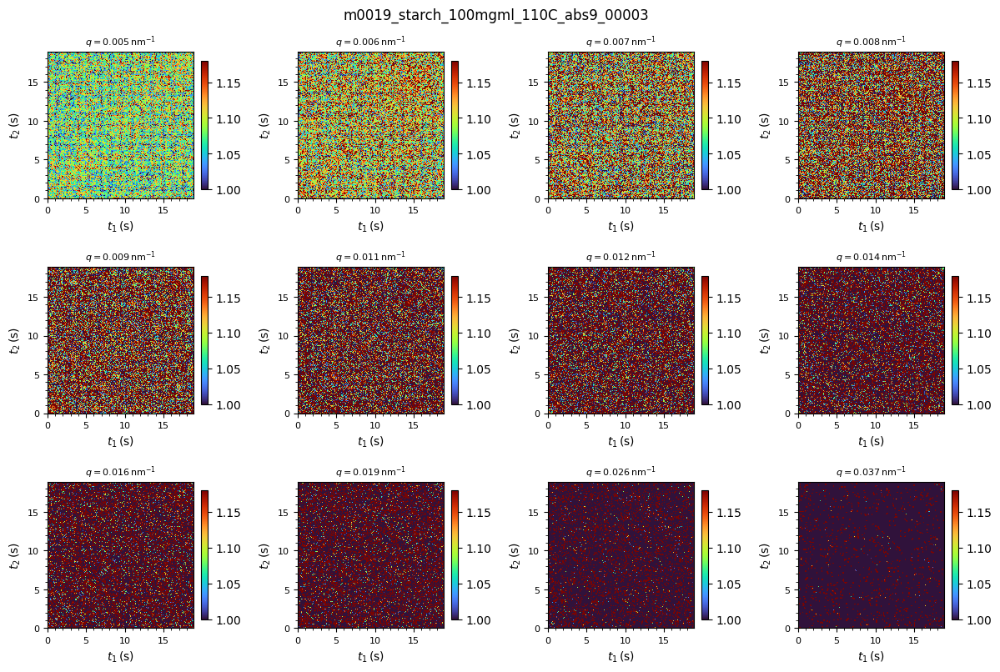


Starting XPCS analysis for entry 1 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


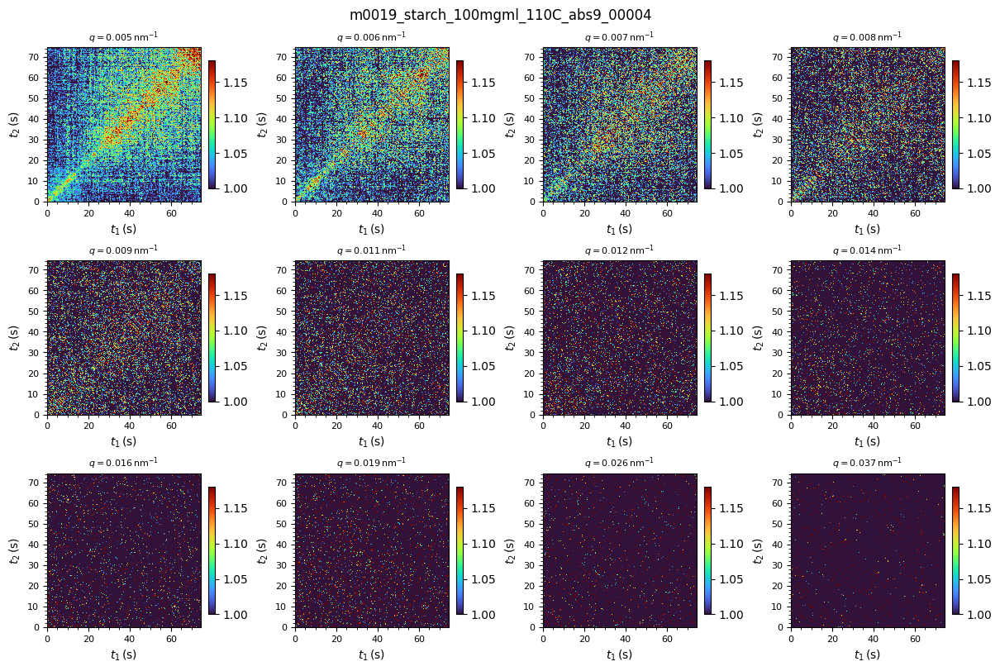


Starting XPCS analysis for entry 2 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


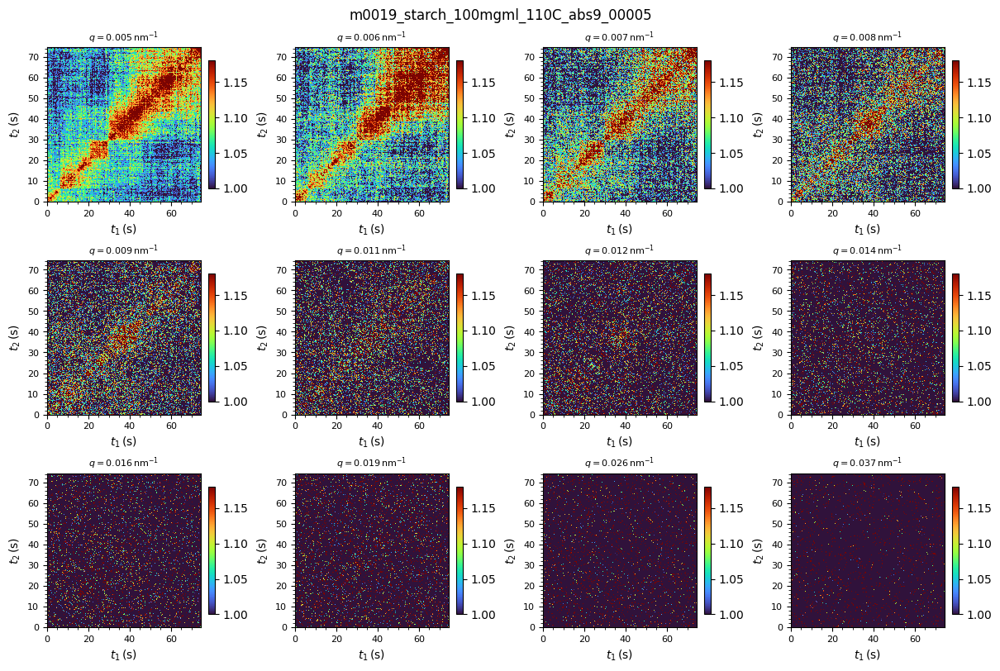


Starting XPCS analysis for entry 3 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


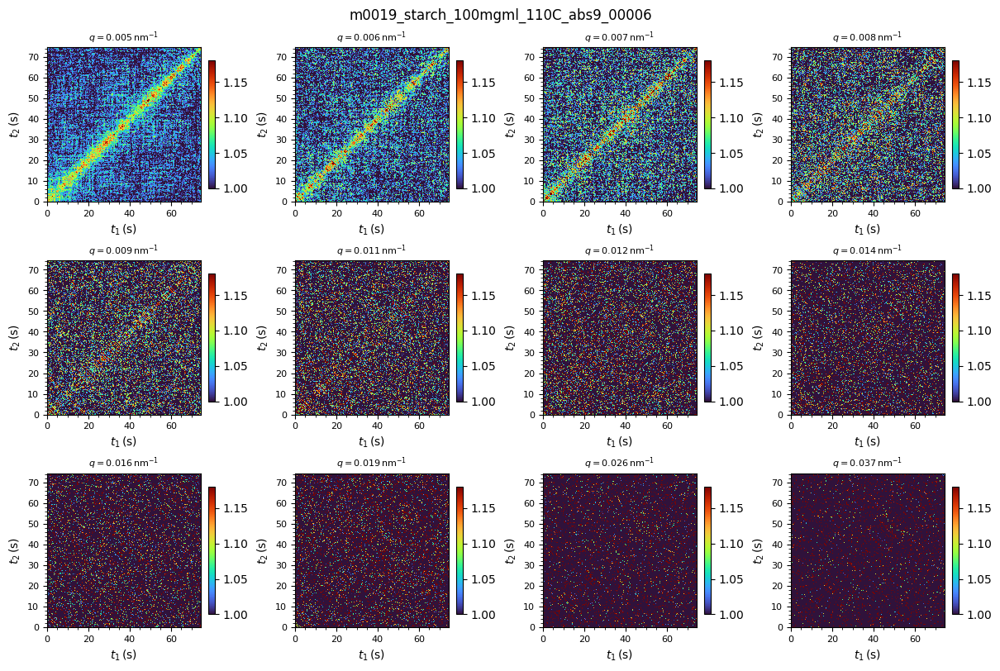


Starting XPCS analysis for entry 4 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


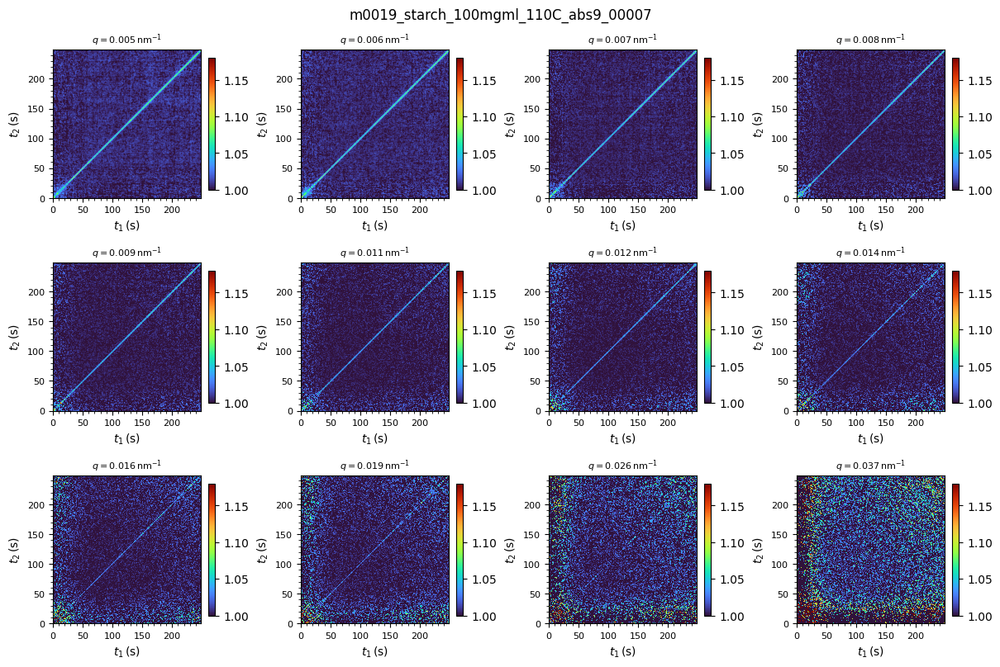


Starting XPCS analysis for entry 5 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


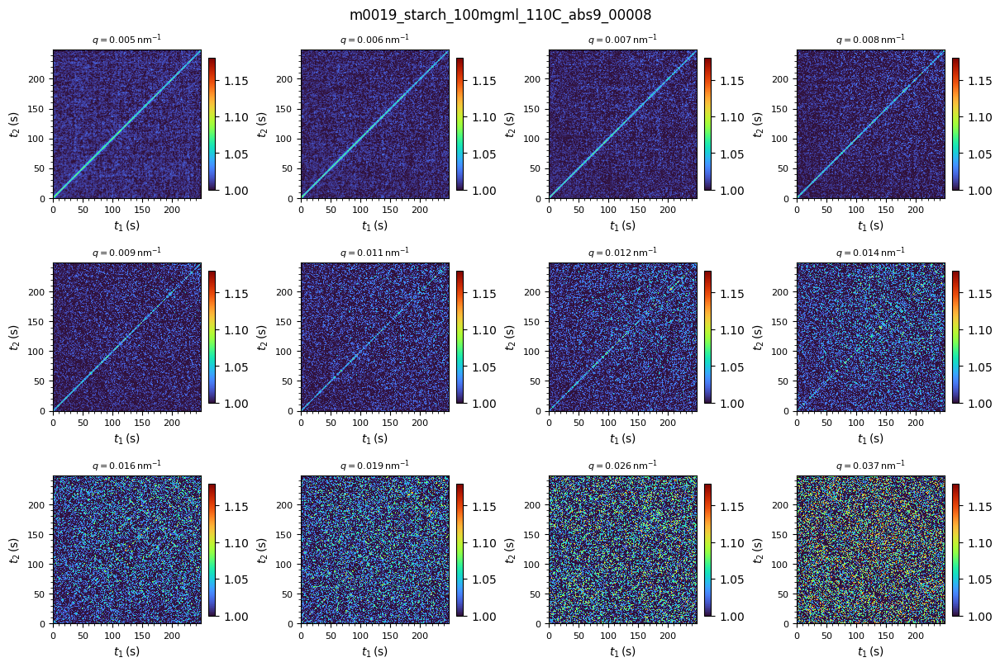


Starting XPCS analysis for entry 6 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


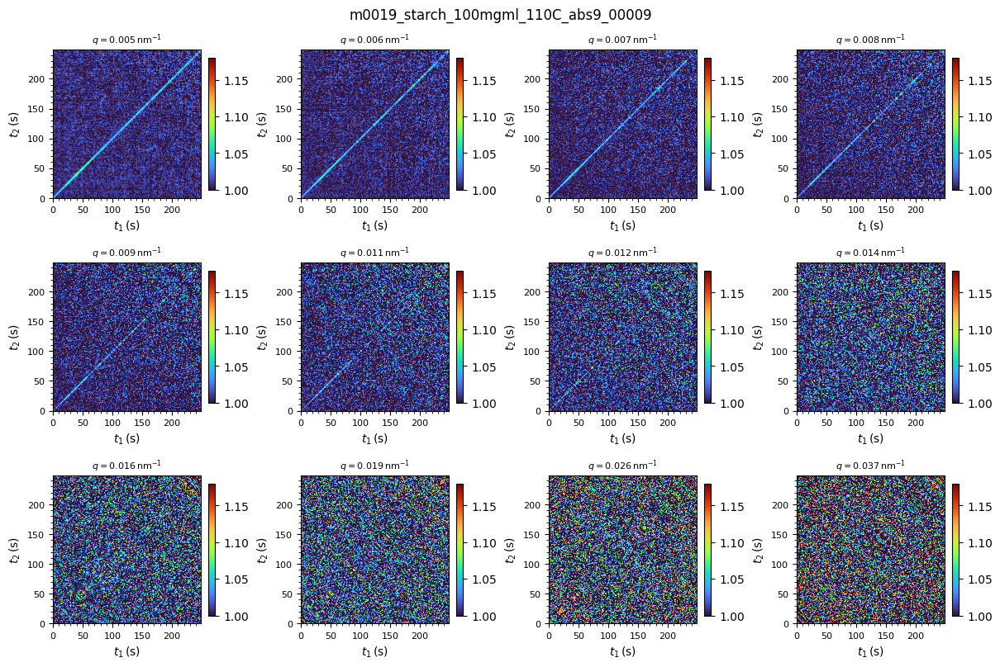


Starting XPCS analysis for entry 7 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


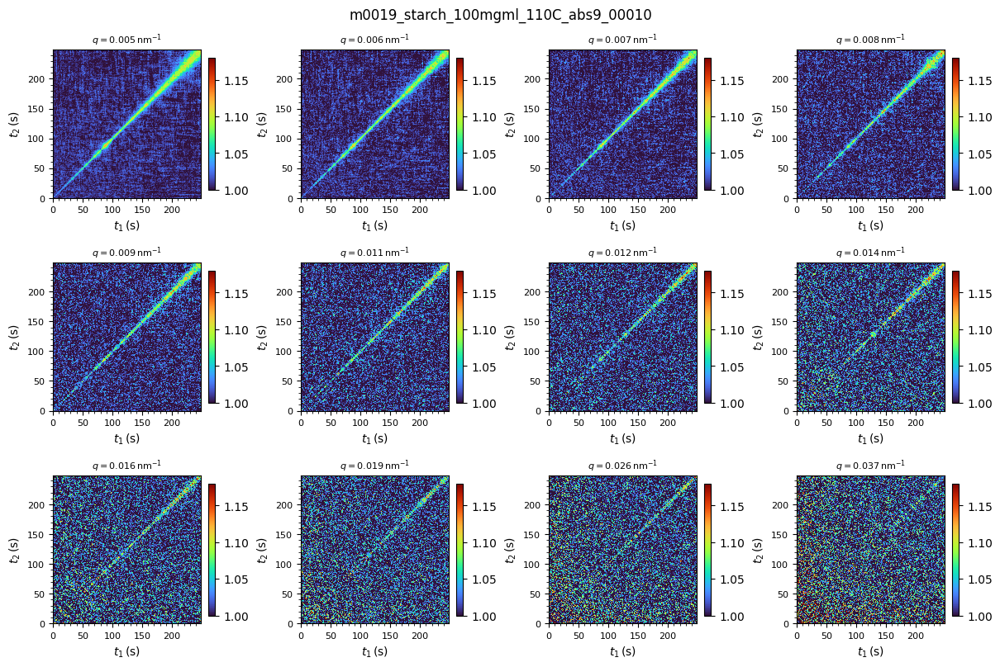


Starting XPCS analysis for entry 8 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


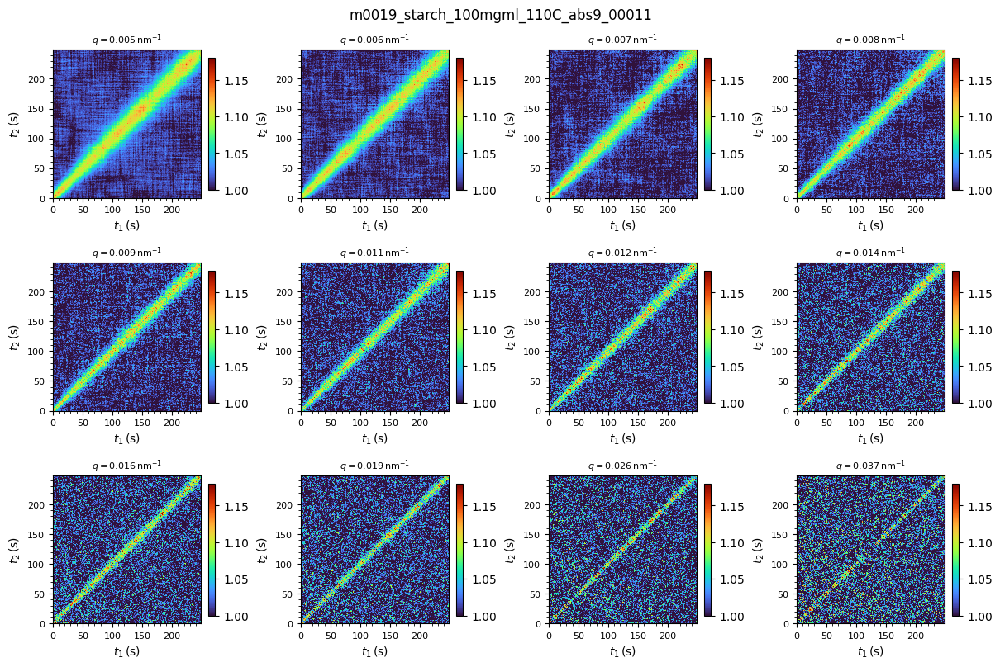


Starting XPCS analysis for entry 9 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


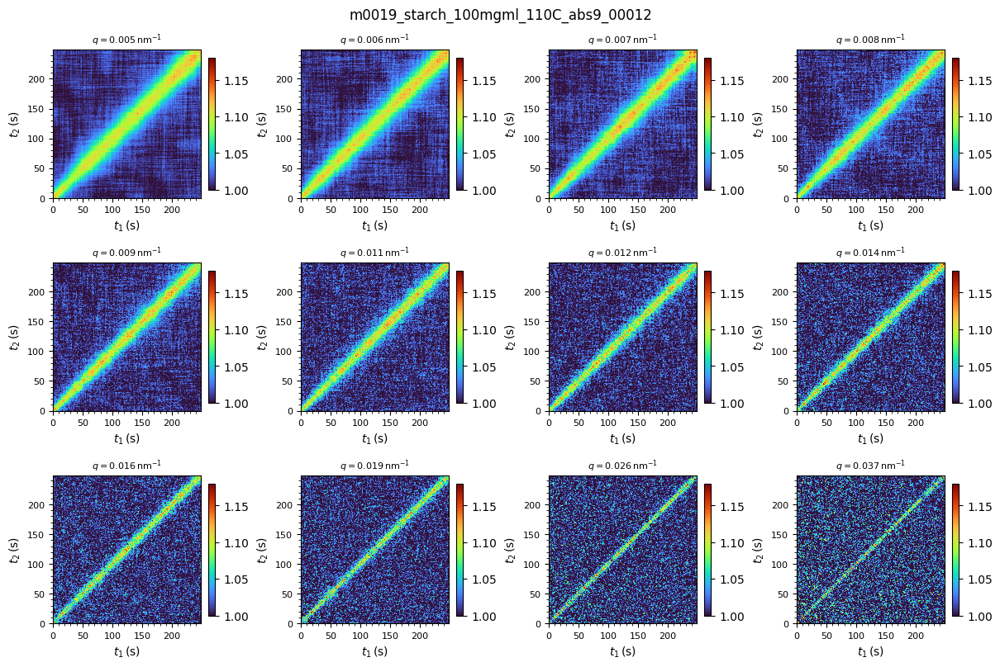


Starting XPCS analysis for entry 10 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


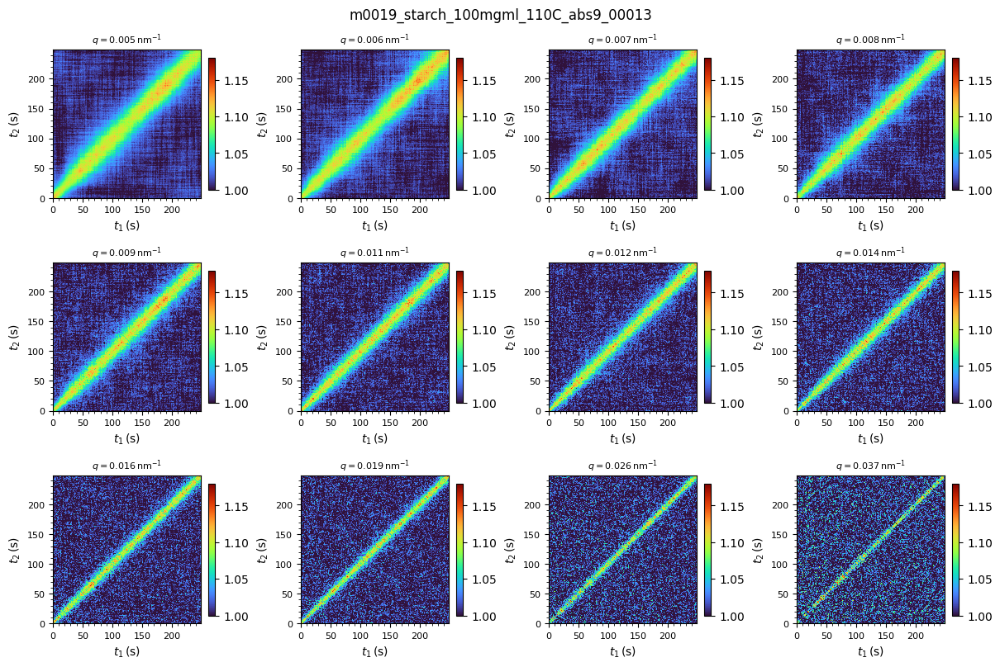


Starting XPCS analysis for entry 11 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


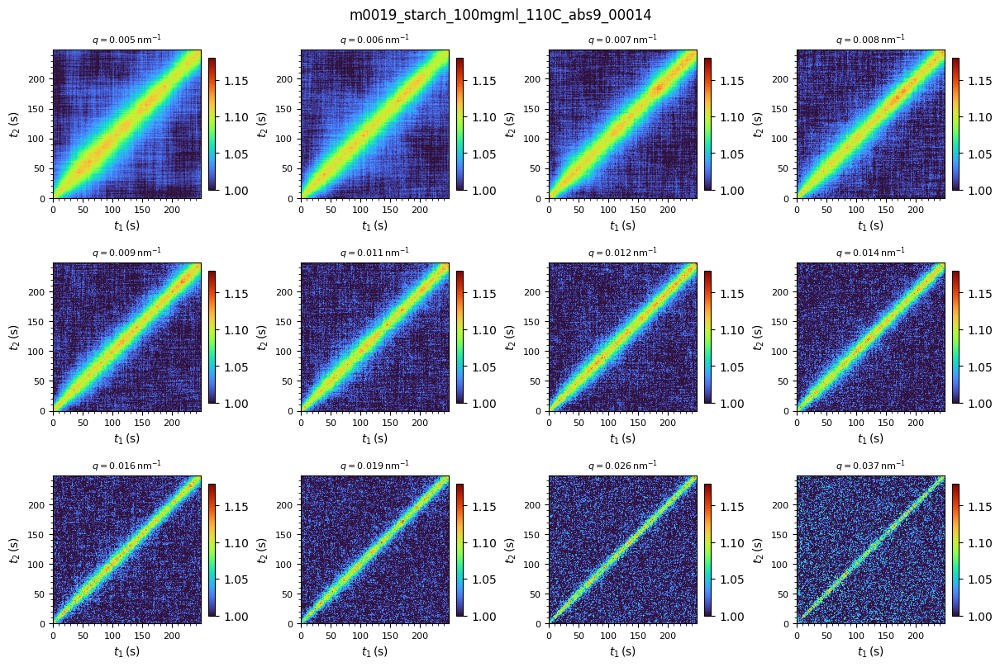


Starting XPCS analysis for entry 12 out of [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
-------------------------------------------------------------------
q-ROIs: 12
q-ROIs values:
[0.0055  0.00627 0.00714 0.00813 0.00927 0.0106  0.0122  0.014   0.0162
 0.019   0.0263  0.037  ]


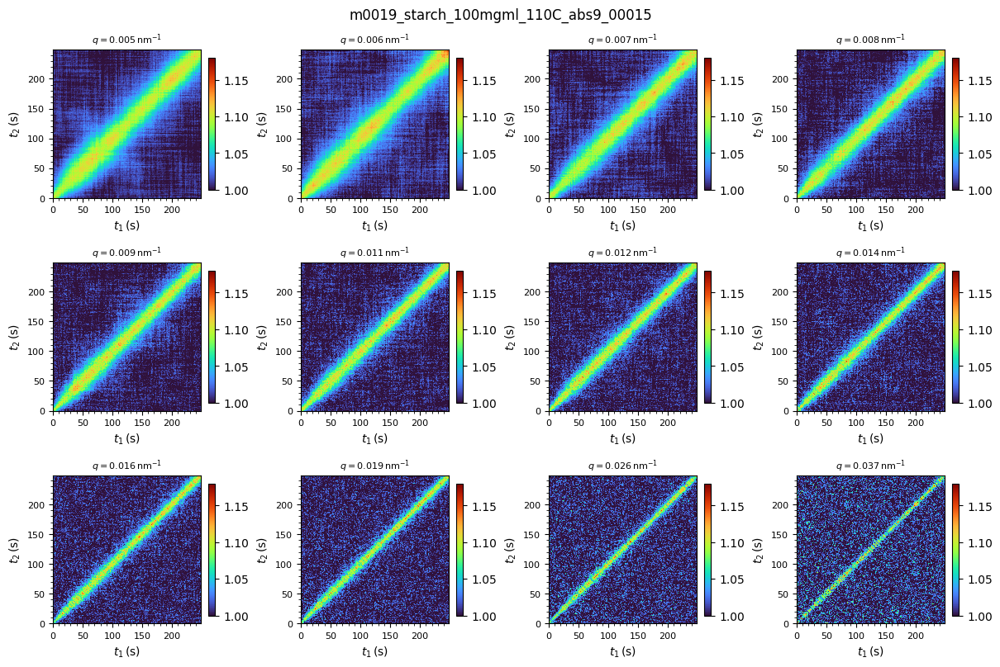

In [42]:
for select_entry in ind_xpcs:
    print(f"Starting XPCS analysis for entry {select_entry} out of {ind_xpcs}")
    print("-------------------------------------------------------------------")
    
    xpcs_data = d.get_item(select_entry)

    ttcs   =   xpcs_data['twotime_corf']
    ttcxy  =   xpcs_data['twotime_xy'] 
    qv     =   xpcs_data['qv']

    series = d.db.loc[select_entry, 'series']

    print(f"q-ROIs: {len(qv)}")
    print("q-ROIs values:")
    print(qv)
    
    fig, axs = plt.subplots(nrows, ncols, figsize=(12,8), constrained_layout=True)
    axs = np.array(axs)
    axs = np.ravel(axs) #if condition else np.ravel(axs)
    
    for i, (ind, ax) in enumerate(zip(ttcs.keys(), axs)):
        img = ax.imshow(ttcs[ind], origin='lower', cmap='turbo', extent=[ttcxy[0], ttcxy[-1]]*2,vmin=vmin, vmax=vmax)
        ax.set_title(f"$q={qv[i]:.3f}\,\mathrm{{nm}}^{{-1}}$", fontsize=8)
        ax.set_xlabel('$t_1\,(\mathrm{s})$', size=10)
        ax.set_ylabel('$t_2\,(\mathrm{s})$', size=10)
        cb = plt.colorbar(img, ax=ax, shrink=.8)
        ax.minorticks_on()
        ax.tick_params(which='major', labelsize=8)

    fig.suptitle(f"{sample}_{int(series):05d}")
    plt.show()
    
    print()

### Process dynamics of a specific qROI value

<span style="font-weight:bold; color:red">Input the q-ROI index of interest below</span>

In [26]:
qROI_ind = 2    # indexing starts from 0 !

vmin = 1.00
vmax = 1.18

<span style="font-weight:bold; color:red">Input the layout of the plot (keep in mind the number of scans you put here)</span>

In [22]:
print(f"You selected to analyse: {len(ind_xpcs)} scans")

You selected to analyse: 4 scans


<span style="font-weight:bold; color:red">Adjust the layout of the plots according to the number of scans</span>

In [23]:
nrows = 2
ncols = 2

Analysing XPCS for the q-ROI of interest
-------------------------------------------------------------------
00 done
02 done
04 done
06 done


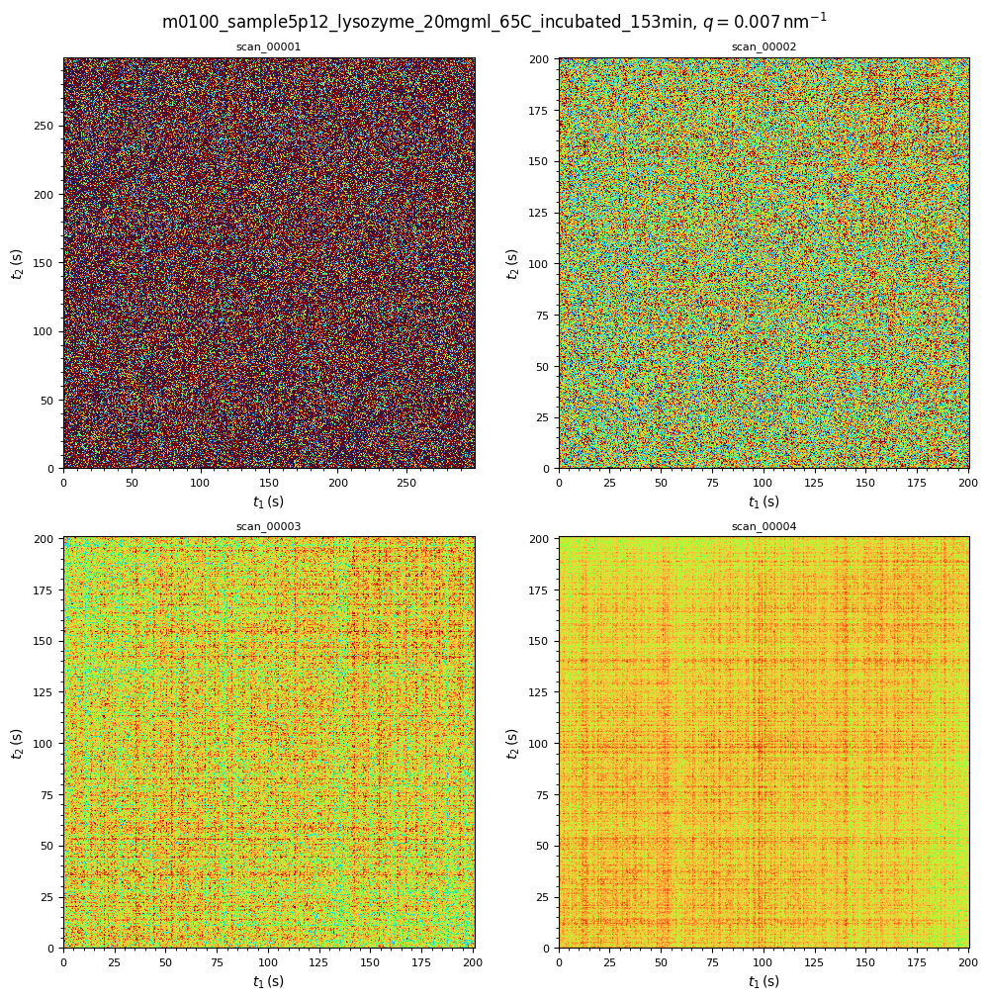

In [24]:
print(f"Analysing XPCS for the q-ROI of interest")
print("-------------------------------------------------------------------")

fig, axs = plt.subplots(nrows, ncols, figsize=(10,10), constrained_layout=True)
axs = np.array(axs)
axs = np.ravel(axs) 

# for select_entry in ind_xpcs:
for i in range(len(ind_xpcs)): 
    select_entry = ind_xpcs[i]

    xpcs_data = d.get_item(select_entry)

    ttcs   =   xpcs_data['twotime_corf']
    ttcxy  =   xpcs_data['twotime_xy'] 
    qv     =   xpcs_data['qv']

    series = d.db.loc[select_entry, 'series']
    

    img = axs[i].imshow(ttcs[qROI_ind], origin='lower', cmap='turbo', extent=[ttcxy[0], ttcxy[-1]]*2,vmin=vmin, vmax=vmax)
    axs[i].set_title(f"scan_{int(series):05d}", fontsize=8)
    axs[i].set_xlabel('$t_1\,(\mathrm{s})$', size=10)
    axs[i].set_ylabel('$t_2\,(\mathrm{s})$', size=10)
    cb = plt.colorbar(img, ax=ax, shrink=.8)
    axs[i].minorticks_on()
    axs[i].tick_params(which='major', labelsize=8)

    fig.suptitle(f"{sample}, $q={qv[qROI_ind]:.3f}\,\mathrm{{nm}}^{{-1}}$")
    
    print(f"{select_entry:02} done")

plt.show()
    

## Plotting SAXS

In [8]:
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
# Define the log binning function
def log_bin_data(qs, values, log_n, errors=None):
    qs = np.array(qs)
    values = np.array(values)
    log_bins = np.logspace(np.log10(qs.min()), np.log10(qs.max()), log_n + 1)
    bin_centers = (log_bins[:-1] + log_bins[1:]) / 2
    
    binned_values = np.zeros(log_n)
    binned_errors = np.zeros(log_n) if errors is not None else None

    for i in range(log_n):
        bin_mask = (qs >= log_bins[i]) & (qs < log_bins[i + 1])
        bin_data = values[bin_mask]
        if len(bin_data) > 0:
            binned_values[i] = np.mean(bin_data)
            if errors is not None:
                bin_errors = np.array(errors)[bin_mask]
                binned_errors[i] = np.sqrt(np.sum(bin_errors**2)) / len(bin_data)
    
    return (bin_centers, binned_values, binned_errors) if errors is not None else (bin_centers, binned_values)

# def add_colorbar(ax, vec, label=None):
#     vec = np.array(vec)
#     divider = make_axes_locatable(ax)
#     cax = divider.append_axes('top', size='4%', pad=-0.1)

#     cmap = cm.jet  # Colormap from blue to red
#     norm = plt.Normalize(vmin=vec.min(), vmax=vec.max())

#     cb1 = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap),
#                        cax=cax,
#                        orientation='horizontal')
#     cb1.set_label(label, fontsize=12, labelpad=5, y=1, rotation=0)
# Define the function to add a colorbar
def add_colorbar(ax, vec, label=None, location='top'):
    vec = np.array(vec)
    divider = make_axes_locatable(ax)

    if location == 'top':
        cax = divider.append_axes('top', size='4%', pad=0.1)
        orientation = 'horizontal'
    elif location == 'bottom':
        cax = divider.append_axes('bottom', size='4%', pad=0.1)
        orientation = 'horizontal'
    elif location == 'left':
        cax = divider.append_axes('left', size='4%', pad=0.1)
        orientation = 'vertical'
    elif location == 'right':
        cax = divider.append_axes('right', size='4%', pad=0.1)
        orientation = 'vertical'
    else:
        raise ValueError("location must be one of 'top', 'bottom', 'left', 'right'")

    cmap = mpl.cm.jet  # Colormap from blue to red
    norm = mpl.colors.Normalize(vmin=vec.min(), vmax=vec.max())

    cb1 = mpl.colorbar.ColorbarBase(cax, cmap=cmap,
                                    norm=norm,
                                    orientation=orientation)
    cb1.set_label(label, fontsize=12, labelpad=5, y=1, rotation=0)


In [9]:
sampleId = 45
log_n = 100  # Number of datapoints used for log binning of data
print(f"Analysing TTCF for {samples[sampleId]}")

Analysing TTCF for m0026_Lara_water


In [10]:
d = Xana()

sample = samples[sampleId]
sample_path = proposal_path / "processed" / "_results" / f"{sample}"

d.load_db(sample_path / "analysis_database.pkl")

Try loading database:
	/asap3/petra3/gpfs/p10/2024/data/11018867/processed/_results/m0026_Lara_water/analysis_database.pkl
Successfully loaded database


In [11]:
ind_saxs = d.db[(d.db['sample'] == sample)& (d.db['analysis']=='saxs')].index.values
t_exp = d.db[(d.db['sample'] == sample)& (d.db['analysis']=='saxs')].t_exposure.values
t_delay = d.db[(d.db['sample'] == sample)& (d.db['analysis']=='saxs')].t_delay.values
n_frames = d.db[(d.db['sample'] == sample)& (d.db['analysis']=='saxs')].nframes.values
display(d.db.loc[ind_saxs])
# print(f"Indices of series: {ind_saxs}")
# print(f"Indices of series: {t_exp}")

,use,sample,analysis,mod,savname,savfile,setupfile,comment,series,subset,t_delay,t_exposure,t_readout,nframes,first,last,master,datdir
1,True,m0026_Lara_water,saxs,2024-05-16 16:31:53.809247,s0001_0001.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,1.0,0.0,0.10001,0.10,0.00001,990.0,10.0,999.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
3,True,m0026_Lara_water,saxs,2024-05-16 16:33:16.251767,s0002_0003.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,2.0,0.0,0.10001,0.10,0.00001,990.0,10.0,999.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...
6,True,m0026_Lara_water,saxs,2024-05-16 16:42:19.747075,s0003_0006.pkl,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,/asap3/petra3/gpfs/p10/2024/data/11018867/proc...,,3.0,0.0,0.05001,0.05,0.00001,190.0,10.0,199.0,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...,/asap3/petra3/gpfs/p10/2024/data/11018867/raw/...


---

<span style="font-weight:bold; color:red">DO NOT RUN BELOW !!! JUST FOR DEBUGGING AND TESTING </span>

In [12]:
from Xana import Soq
s = Soq(d)
# ind_saxs = ind_saxs[:12]
print (ind_saxs)

[1 3 6]


In [547]:
# dir(s) # help(d)# help(s)

In [548]:
# exp_times = []
# Qs = []
# Q_errors = []
# q_range = (0.001, 0.04)  # Specify your q range here

# # Calculate cumulative waiting time
# cumulative_time = 0


# # Create a figure with two side-by-side subplots
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

# # Process each SAXS entry
# for i in ind_saxs:
#     # Calculate the waiting time based on cumulative previous exposure and delay times
#     current_exp_time = d.db['t_exposure'][i] * d.db['first'][i]
#     current_delay_time = d.db['t_delay'][i] * d.db['last'][i]
    
#     exp_time = cumulative_time + current_exp_time + current_delay_time
#     cumulative_time += current_exp_time + current_delay_time

#     q = s.Xana.get_item(i)['soq'][:, 0]
#     Iq = s.Xana.get_item(i)['soq'][:, 1] / d.db['t_exposure'][i]  # Normalize by exposure time
#     Iq_err = s.Xana.get_item(i)['soq'][:, 2] / d.db['t_exposure'][i]  # Normalize error by exposure time
    
#     # Filter q and Iq to be within the specified q_range
#     mask = (q >= q_range[0]) & (q <= q_range[1])
#     q = q[mask]
#     Iq = Iq[mask]
#     Iq_err = Iq_err[mask]
    
#     # Log binning
#     qs_n, Iq_n = log_bin_data(q, Iq, log_n)
#     qs_n, Iq_n, Iq_err_n = log_bin_data(q, Iq, log_n, errors=Iq_err)
    
#     # Calculate scattering invariant Q
#     Q = simps(qs_n**2 * Iq_n, qs_n)
#     Q_err = simps(qs_n**2 * Iq_err_n, qs_n)
    
#     exp_times.append(exp_time)
#     Qs.append(Q)
#     Q_errors.append(Q_err)

#     # Plot I(q) vs q for the current SAXS entry
#     # ax1.plot(q, Iq, label=f'{exp_time:.2f} s')
#     ax1.plot(q, Iq, label=f'{exp_time:.2f} s', color=cm.jet(exp_time / cumulative_time))

# # Convert lists to numpy arrays
# exp_times = np.array(exp_times)
# Qs = np.array(Qs)
# Q_errors = np.array(Q_errors)

# # Finalize the intensity vs q plot
# ax1.set_xscale('log')
# ax1.set_yscale('log')
# ax1.set_xlabel('$q$ $[nm^{-1}]$', fontsize=15)
# ax1.set_ylabel('$I(q)$ $[a.u.]$', fontsize=15)
# ax1.legend(title='Waiting Time $t_w$', loc='best')
# ax1.set_title(f'{sample} SAXS Profiles')

# # Plot Q as a function of waiting time
# ax2.errorbar(exp_times, Qs, yerr=Q_errors, fmt='o-',label=sample) 
# ax2.set_xscale('log')
# ax2.set_yscale('log')
# ax2.set_xlabel('$t^{w}$ (s)')
# ax2.set_ylabel('Q (scattering invariant)')
# ax2.legend()
# ax2.set_title('Scattering Invariant Q vs. Waiting Time')

# plt.tight_layout()
# # Add the colorbar
# add_colorbar(ax1, exp_times, 'Waiting Time (s)')
# plt.show()

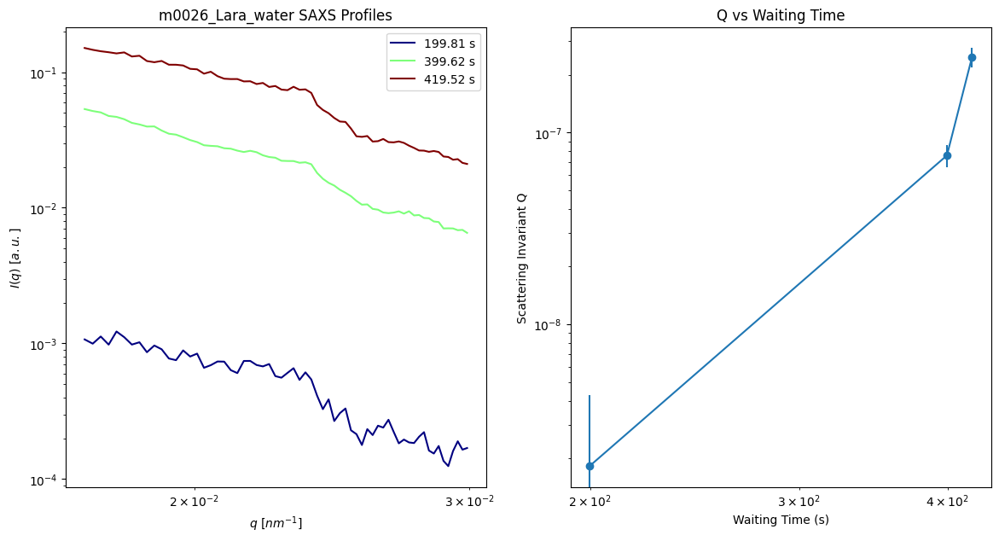

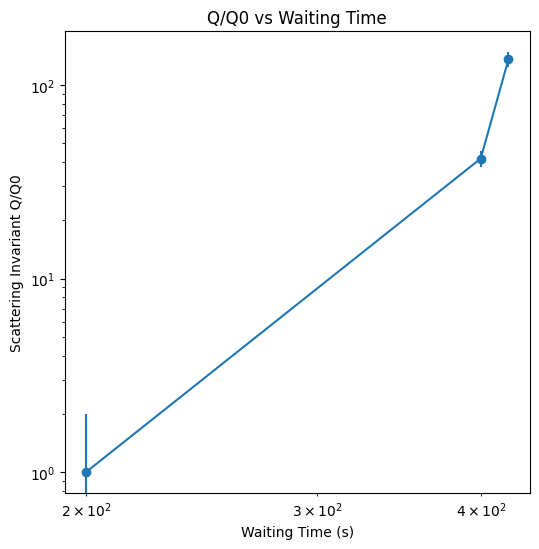

In [13]:
# Set up the plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
fig3, ax3 = plt.subplots(figsize =(6,6))

# Initialize variables
cumulative_time = 0
exp_times = []
Qs = []
Q_errors = []
q_range = (0.017, 0.03)  # Specify your q range here

# Process each SAXS entry
ax1.set_prop_cycle(plt.cycler('color',plt.cm.jet(np.linspace(0, 1, int(len(ind_saxs))   ))))#8))))

for i in ind_saxs:
    # Calculate the waiting time based on cumulative previous exposure and delay times
    current_exp_time = d.db['t_exposure'][i] * (d.db['last'][i])
    current_delay_time = d.db['t_delay'][i] * (d.db['last'][i])

    cumulative_time += current_exp_time + current_delay_time
    exp_time = cumulative_time

    exp_times.append(exp_time)
    
    # exp_time = cumulative_time + current_exp_time + current_delay_time
    # cumulative_time += current_exp_time + current_delay_time

    q = s.Xana.get_item(i)['soq'][:, 0]
    Iq = s.Xana.get_item(i)['soq'][:, 1] / d.db['t_exposure'][i]  # Normalize by exposure time
    Iq_err = s.Xana.get_item(i)['soq'][:, 2] / d.db['t_exposure'][i]  # Normalize error by exposure time

    # Filter q and Iq to be within the specified q_range
    mask = (q >= q_range[0]) & (q <= q_range[1])
    q = q[mask]
    Iq = Iq[mask]
    Iq_err = Iq_err[mask]

    # Log binning
    qs_n, Iq_n, Iq_err_n = log_bin_data(q, Iq, log_n, errors=Iq_err)

    # Calculate scattering invariant Q
    Q = simps(qs_n**2 * Iq_n, qs_n)
    Q_err = simps(qs_n**2 * Iq_err_n, qs_n)

    Qs.append(Q)
    Q_errors.append(Q_err)

    # Plot I(q) vs q for the current SAXS entry
    # ax1.plot(q, Iq, label=f'{exp_time:.2f} s', color=cm.jet(current_exp_time / cumulative_time))
    ax1.plot(q, Iq, label=f'{exp_time:.2f} s')

# Convert lists to numpy arrays
exp_times = np.array(exp_times)
Qs = np.array(Qs)
Q_errors = np.array(Q_errors)

# Plot Q vs waiting time
ax2.errorbar(exp_times, Qs, yerr=Q_errors, fmt='o-')
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.set_xlabel('Waiting Time (s)')
ax2.set_ylabel('Scattering Invariant Q')
ax2.set_title('Q vs Waiting Time')

# Plot Q/Q0 vs waiting time
ax3.errorbar(exp_times, Qs/Qs[0], yerr=Q_errors/Q_errors[0], fmt='o-')
ax3.set_xscale('log')
ax3.set_yscale('log')
ax3.set_xlabel('Waiting Time (s)')
ax3.set_ylabel('Scattering Invariant Q/Q0')
ax3.set_title('Q/Q0 vs Waiting Time')


# Set plot labels and legends
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel('$q$ $[nm^{-1}]$')
ax1.set_ylabel('$I(q)$ $[a.u.]$')
ax1.legend(loc='best')
ax1.set_title(f'{sample} SAXS Profiles')

# Add the colorbar
# add_colorbar(ax1, exp_times, 'Waiting Time (s)')
# add_colorbar(ax1,exp_times,r'$t_\mathrm{w}$ (s)',location='top') #exposure times(s)
# plt.savefig(f'{sample}-Q{q_range} SAXS Profiles.png')
plt.show()


### Manual mode

In [ ]:
select_entry = 7

In [ ]:
# saxs_data = d.get_item(select_entry)

# ttcs   =   xpcs_data['twotime_corf']
# ttcxy  =   xpcs_data['twotime_xy'] 
# qv     =   xpcs_data['qv']

# series = d.db.loc[select_entry, 'series']

# print(f"q-ROIs: {len(qv)}")
# print("q-ROIs values:")
# print(qv)

NameError: name 'xpcs_data' is not defined

In [189]:
saxs_data.keys()

dict_keys(['corf', 'dcorf', 'trace', 'qv', 'qroi', 'Isaxs', 'mask', 'twotime_corf', 'twotime_par', 'twotime_xy', 'chi4', 'xtwotime_corf', 'xchi4'])

In [190]:
saxs_data['soq'].shape

KeyError: 'soq'

In [39]:
def merge_soq(d,ind):
    a=np.zeros([len(d.get_item(ind[0])['soq'][:,0])])
    n=0
    for i in ind:
        a=a+d.get_item(i)['soq'][:,1]
        n=n+1
    return  a/n  

---

## Data FOR LOGBOOK

In [31]:
import h5py

In [32]:
samples = ah.get_raw_samples(proposal_path)
samples

{0: 'Aerogel_01',
 1: 'Background_01',
 2: 'Background_02',
 3: 'GWS',
 4: 'LaB6_01',
 5: 'Logbook',
 6: 'SPOCK',
 7: 'align_01',
 8: 'align_02',
 9: 'align_03',
 10: 'align_04',
 11: 'align_05',
 12: 'align_06',
 13: 'align_07',
 14: 'e4m_dummy2',
 15: 'e4m_dummy3',
 16: 'e4m_dummy4',
 17: 'e4m_restart',
 18: 'e4m_restart2',
 19: 'e4m_restart3',
 20: 'm0001_20mgml_BLG_pH2_RT',
 21: 'm0002_20mgml_BLG_pH2_90C_for_1h',
 22: 'm0003_20mgml_BLG_pH2_RT',
 23: 'm0004_20mgml_BLG_pH2_90C_for_5h',
 24: 'm0005_sample1_HEWL_20mgml_pure_24C',
 25: 'm0006_sample2_HEWL_20mgml_heated_at65C',
 26: 'm0007_sample2_HEWL_20mgml_heated_at65C_Au',
 27: 'm0008_sample3_HEWL_20mgml_heated_at65C_Au',
 28: 'm0009_sample3_HEWL_20mgml_heated_at65C_Au',
 29: 'm0010_sample3_HEWL_20mgml_heated_at65C_Au',
 30: 'm0011_sample3_HEWL_20mgml_heated_at65C_Au',
 31: 'm0012_buffer_100mMNaCl_10mMHCl',
 32: 'm0013_starch_100mgml_110C',
 33: 'm0014_BSA_YCl3_dense_10C',
 34: 'm0015_BSA_YCl3_dense_5C',
 35: 'm0016_BSA_YCl3_dense_15

In [33]:
sampleId = 125

In [34]:
scans = ah.get_sample_scans(proposal_path,samples[sampleId])
print()
detectors = ah.get_scan_detectors(proposal_path, samples[sampleId], scans)
print()

print("Folders:")
print()
!ls -d {proposal_path / "raw"}/{samples[sampleId]}*





Sample name    : m0101_starch_100mgml_1500mMNaCl_83p5C_abs16
scans available: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]

Detectors available for m0101_starch_100mgml_1500mMNaCl_83p5C_abs16:
Scan 1    : ['e500']
Scan 2    : ['e500']
Scan 3    : ['e500']
Scan 4    : ['e500']
Scan 5    : ['e500']
Scan 6    : ['e500']
Scan 7    : ['e500']
Scan 8    : ['e500']
Scan 9    : ['e500']
Scan 10   : ['e500']
Scan 11   : ['e500']
Scan 12   : ['e500']
Scan 13   : ['e500']
Scan 14   : ['e500']
Scan 15   : ['e500']
Scan 16   : ['e500']

Folders:

/asap3/petra3/gpfs/p10/2024/data/11018867/raw/m0101_starch_100mgml_1500mMNaCl_83p5C_abs16
/asap3/petra3/gpfs/p10/2024/data/11018867/raw/m0101_starch_100mgml_1500mMNaCl_83p5C_abs16_00001
/asap3/petra3/gpfs/p10/2024/data/11018867/raw/m0101_starch_100mgml_1500mMNaCl_83p5C_abs16_00002
/asap3/petra3/gpfs/p10/2024/data/11018867/raw/m0101_starch_100mgml_1500mMNaCl_83p5C_abs16_00003
/asap3/petra3/gpfs/p10/2024/data/11018867/raw/m0101_starch_100mgml_1500

In [35]:
folder_to_check = 'm0102_starch_100mgml_500mMNaCl_80C_abs16_00013'

scan_no       = int(folder_to_check[-5:])
detector_name = detectors[scan_no][0]

file_to_check = Path(f"/asap3/petra3/gpfs/p10/2024/data/11018867/raw/{folder_to_check}/{detector_name}") / f"{folder_to_check}_master.h5"
print("Checking the data from the file:")
print(file_to_check)
print("------------")

with h5py.File(file_to_check,'r') as f:
    frame_time = f['/entry/instrument/detector']['frame_time'][()]
    count_time = f['/entry/instrument/detector']['count_time'][()]
    nframes    = f['/entry/instrument/detector/detectorSpecific']['nimages'][()]

delay_time = frame_time - count_time
    
print(f"{'Scan no.:':<10} {scan_no}")
print(f"{'nframes:':<10} {nframes}")
print(f"{'t_exp:':<10} {count_time:.02f}")
print(f"{'t_delay':<10} {delay_time:.02f}")


Checking the data from the file:
/asap3/petra3/gpfs/p10/2024/data/11018867/raw/m0102_starch_100mgml_500mMNaCl_80C_abs16_00013/e500/m0102_starch_100mgml_500mMNaCl_80C_abs16_00013_master.h5
------------
Scan no.:  13
nframes:   2500
t_exp:     0.10
t_delay    0.00
